# **Total Deep Variation for Linear Inverse Problems**

*Based on the paper of Erich Kobler, Alexander Effland, Karl Kunisch and Thomas Pock from Graz University*

Simplify version for Model Based Deep Learning course, 2022, Ben Gurion University

This work is done by:

- May Malka (203333919)

- Daniel Mitchell (205551674)


# **Image Denoising**

The statistical interpretation of linear inverse problems allows the treatment of measurement uncertainties in the input
data $z$ and missing information in a rigorous framework. The classical estimator of $x$ given the curropted observation $z$ is given by the MAP estimator which amount to minimize the variational problem:

### $𝜀(x)$ = $𝔇(x,z) + ℛ(x)$

Here, $𝔇(x,z)$ can be identified with the minus log likelihood $-log(P(z|x)$ and the regularization term correspond to the negative log probability of the prior distribution $-log(P(x)$. Common choise is that $z$ corrupted with gaussian noise, resulting in $𝔇(x,z) = ||Ax-z||^2_2$ where $A$ can be interpreted as the downsampling matrix for super resolution tasks.
Here, for image denoising we later assume that $A = Id$, where $Id$ is the identity matrix.

For the regularizer $ℛ(x)$, Total Variation is classical and widely use. 
Total Variation (TV) is a noise removal process based on the principle that signals with excessive and possibly spurious detail have high total variation, that is, the integral of the absolute image gradient is high. According to this principle, reducing the total variation of the signal—subject to it being a close match to the original signal—removes unwanted detail whilst preserving important details such as edges.

Suppose that we are given a noisy image $z$ and wish to compute a denoised image $x$ over a 2D space. The minimization problem we are looking to solve is:

$min_{x \in X} $ $\{{||Ax-z||^2_2}+\int_{x}||\nabla x||_1dx\}$

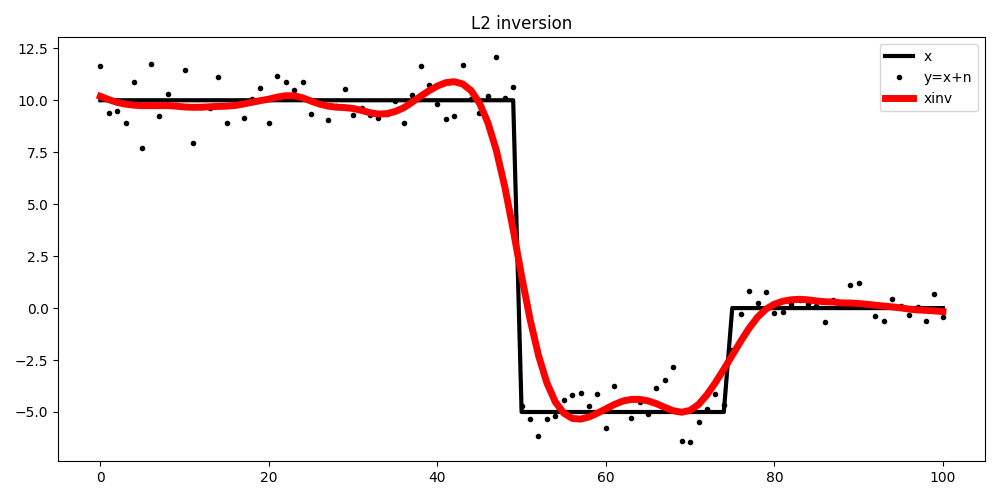

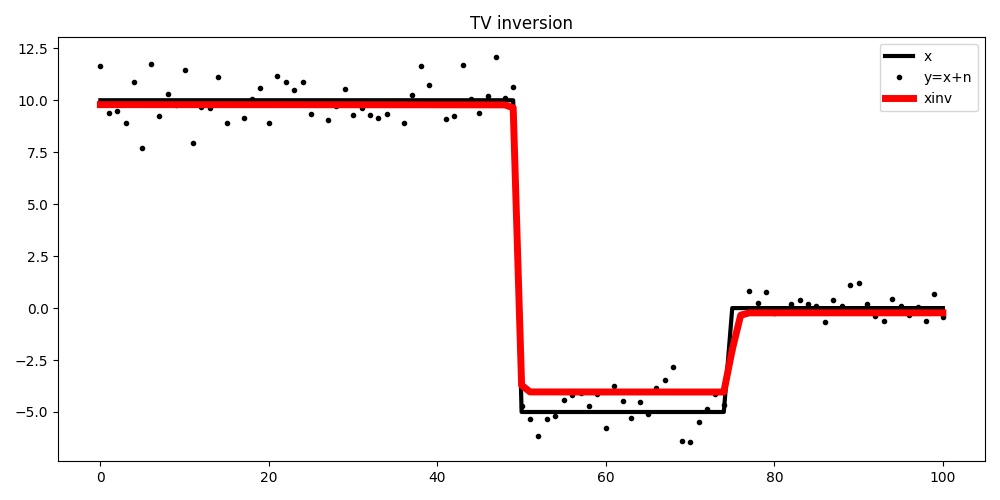

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import skimage as ski
import scipy.sparse
import time
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader
import skimage
import skimage.io
import os
from torch.utils.data import DataLoader
from skimage import io, img_as_float
from skimage.restoration import denoise_tv_chambolle
import matplotlib
import copy

device = torch.device("cuda" if torch.cuda.is_available() else "cpu") 

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


**Dataset: Microsoft COCO**

Here, we randomly samples 400 images from COCO dataset.

We resize the images to 224 $\times$ 224 pixels for training due to compute limitations in Colab.

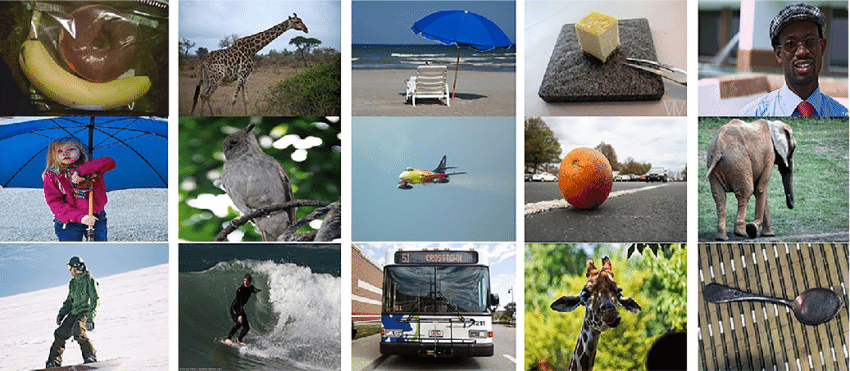

In [ ]:
torch.manual_seed(99)

data_dir = '/content/gdrive/MyDrive/ColabNotebooks/Coco_MBDL/'
filenames = [name for name in os.listdir(data_dir)]
size = 224
Resize = torchvision.transforms.Resize((size,size))
dataset = []

for idx,name in enumerate(filenames):
  img =  torchvision.io.read_image(data_dir + name)
  if img.shape[0] == 1:
      continue
  max = (torch.max(img))
  min = (torch.min(img))
  img = (img-min)/(max-min)
  img = Resize(img)
  dataset.append(img)

We create new noisy dataset by adding gaussian noise $n ∼ 𝒩(0,\sigma)$ to each one of the images as $z = x + n$.

Here we set $\sigma = 0.05$.



In [ ]:
## add noise function
def add_gaussian_noise(data,sigma):
  noisy_data = []
  for idx,img in enumerate(data):
    noise = np.random.normal(0, sigma, (img.shape[1],img.shape[2]))
    noisy_img = img + noise
    noisy_data.append(noisy_img)
  return noisy_data

sigma = 0.05
noisy_data = add_gaussian_noise(dataset,sigma)

## **Total Variation - Purely Model-Based**

The solution for $min_{x \in X} $ $\{{||Ax-z||^2_2}+\int_{x}||\nabla x||_1dx\}$ can be achieved iteratively in a model-based approach:



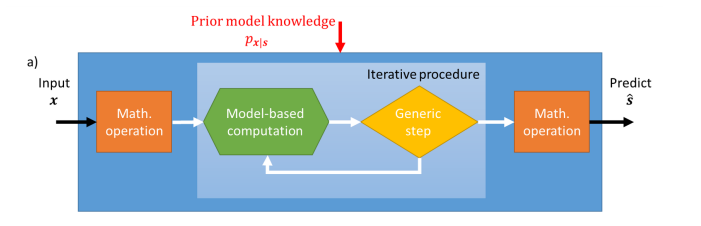

The exact solution described by the following algorithm for grayscale image:

**The same can be done for color images but for each channel*

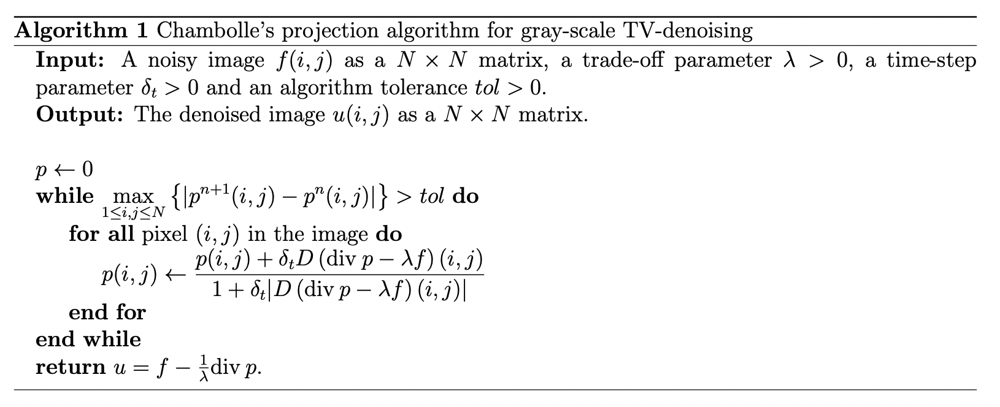

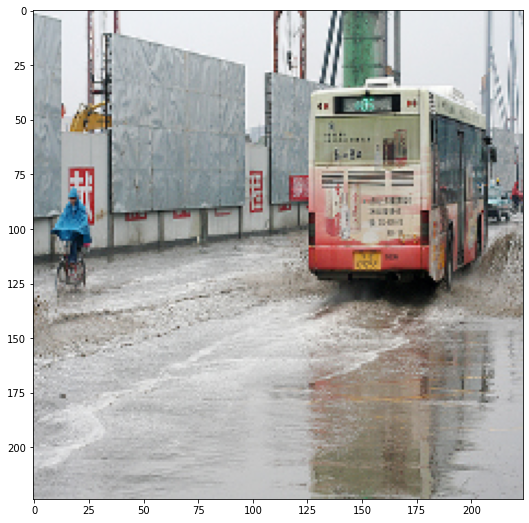

In [ ]:
def disp_img(img):
  matplotlib.rcParams['figure.figsize'] = [9, 9]
  img = torch.permute(img,(1,2,0))
  plt.figure
  plt.imshow(img)
  plt.show()
  
img_num = 5
disp_img(dataset[img_num])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


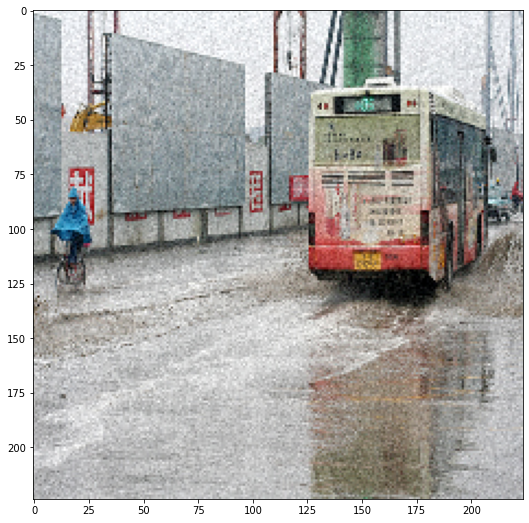

In [ ]:
disp_img(noisy_data[img_num])

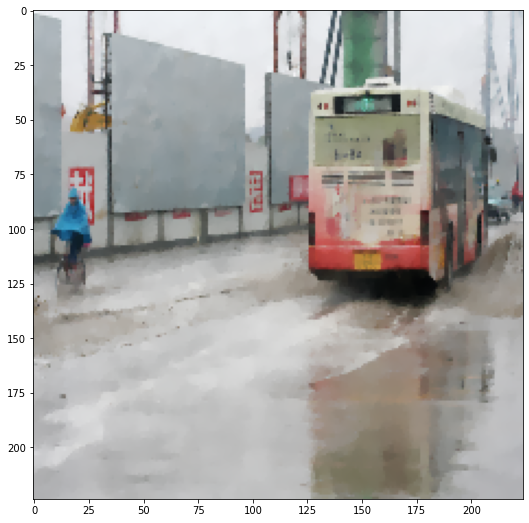

In [ ]:
img = np.array(torch.permute(noisy_data[img_num],(1,2,0)))
denoise_img = denoise_tv_chambolle(img, weight=0.06, eps=0.000001, n_iter_max=30, multichannel=True)

plt.figure()
plt.imshow(denoise_img)

## **Total Deep Variation - Model-Based Deep Learning Approach**



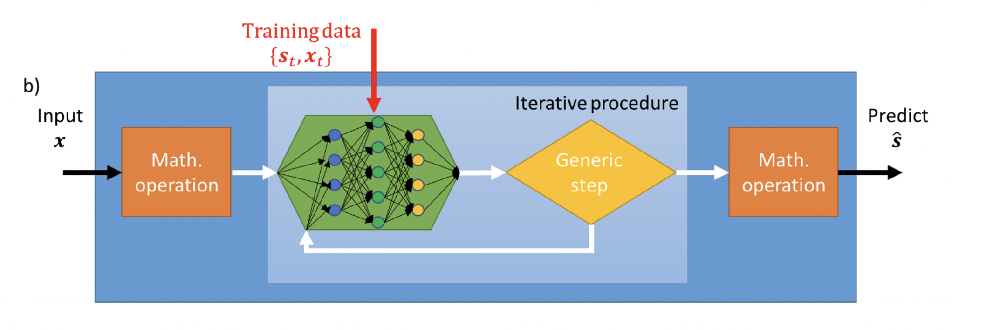

### **The Model: DNN Aided Prior** 

$ℛ(x) --> ℛ(x,θ)$

$ℛ(x,θ) = \sum_ir(x,θ)_i$ which is the sum of the pixelwise deep variation defined as $r(x,θ) = w^T𝒩(Kx)$ where $w$ is a weight matrix and $𝒩(Kx)$ is Convolutional Neural Network with the following architecture:

- Convolutional Neural Network comprised with 3 MacroBlocks
- Each MacroBlock comprised with 5 MicroBlocks
- Each MicroBlock has a U-Net shape with 3x3 convolotional layer $K_{j,1}^i$ followed by LogStudentT activation $\Phi(x)$ followed by another 3x3 Convolutional layer with residual connection results in:  $Mi_j^i(x) = x + K_{j,2}^i⋅Φ(K_{j,1}^i(x))$

Downsampling and Upsampling is implemented in order to avoid aliasing by 2x2 Convolutional layers with a stride of 2.

Final convolutional layer is implemented on the final concatanation to map $2m$ feature channels into $m$ feature channels.


The full architecture is depicted in the following figure:


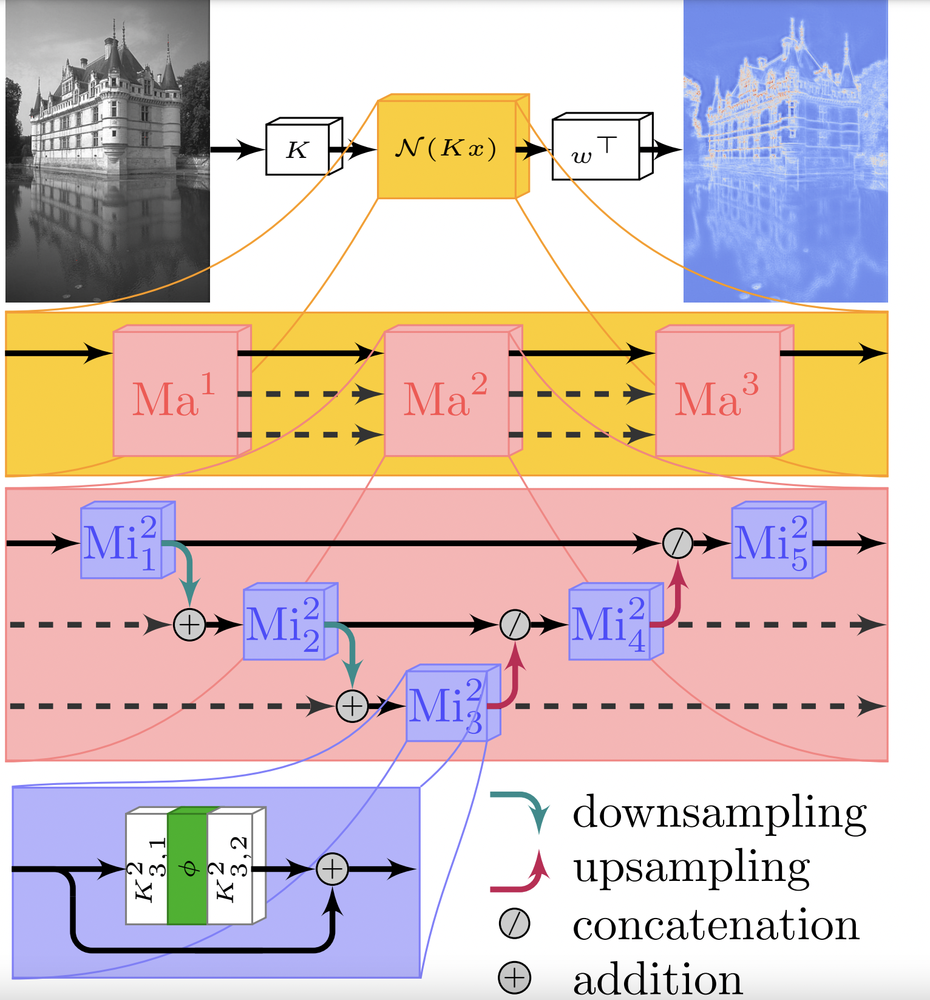

In [ ]:
class LogStudentT(torch.nn.Module):
    '''Log Student T Activation'''
    def __init__(self, v=9):
        super(LogStudentT, self).__init__()
        self.v = v

    def apply_logsudent(self,x):
        return (1 / (2 * self.v)) * torch.log(1 + self.v * x ** 2)


In [ ]:
class MicroBlock(nn.Module):
    ''' Implementation of MicroBlock with residual connection'''
    def __init__(self, num_features, first=False, last=False):
        super().__init__()

        self.last = last
        if first:
            self.conv1 = nn.Conv2d(3, num_features, kernel_size=3,padding=(1,1), bias=False)
        else:
            self.conv1 = nn.Conv2d(num_features, num_features, kernel_size=3,padding=(1,1), bias=False)
        self.act = LogStudentT()
        self.conv2 = nn.Conv2d(num_features, num_features, kernel_size=3, padding=(1, 1), bias=False)
        if self.last:
            self.conv3 = nn.Conv2d(num_features, 3, kernel_size=3,padding=(1,1), bias=False)


    def forward(self, x):
        x = self.conv1(x)
        phi_x = self.act.apply_logsudent(x)
        x = x + self.conv2(phi_x)
        if self.last:
            return self.conv3(x)
        return x

In [ ]:
class MacroBlock(nn.Module):
    ''' Implementation of the MacroBlock, Comprised with 5 Microblock
        In the training procedure (forward_pass function) we use downsample / upsample wherever needed '''
    def __init__(self, num_features,first_mab=True,last_mab=False):
        super().__init__()

        self.num_features = num_features
        self.conv_2m_m = nn.Conv2d(num_features*2,num_features,kernel_size=(1,1),bias=False)
        self.downsampling = nn.Conv2d(num_features,num_features,kernel_size=(2,2),stride=2,bias=False)
        self.upsampling = nn.ConvTranspose2d(num_features, num_features, kernel_size=(2, 2), stride=2,bias=False)
        # self.weights = nn.Linear(size,size)

    def block(self,num_features,first_mab,last_mab):
        mib1 = MicroBlock(num_features,first=first_mab)
        mib2 = MicroBlock(num_features)
        mib3 = MicroBlock(num_features)
        mib4 = MicroBlock(num_features)
        mib5 = MicroBlock(num_features,last=last_mab)
        return nn.Sequential(mib1,mib2,mib3,mib4,mib5)


    def forward_pass(self,x,first_mab,last_mab,block):
        if first_mab:
            x1 = x
        else:
            x1 = x[0]
            x2 = x[1]
            x3 = x[2]

        mib_out1 = block[0](x1)
        out1 = self.downsampling(mib_out1)
        if not first_mab:
            out1 = x2 + out1
        mib_out2 = block[1](out1)
        out2 = self.downsampling(mib_out2)
        if not first_mab:
            out2 = x3 + out2
        mib_out3 = block[2](out2)
        mib_out3_us = self.upsampling(mib_out3)
        concat_out2_out3 = self.conv_2m_m(torch.cat([mib_out2, mib_out3_us], 1))
        mib_out4 = block[3](concat_out2_out3)
        mib_out4_us = self.upsampling(mib_out4)
        concat_out1_out2 = self.conv_2m_m(torch.cat([mib_out1, mib_out4_us], 1))
        mib_out5 = block[4](concat_out1_out2)
        if last_mab:
            return mib_out5
        else:
            return [mib_out5,mib_out4,mib_out3]


In [ ]:
class TDV(MacroBlock):
    ''' Construction of the TDV Regularizer, robust to any number of scales '''
    def __init__(self, num_features, num_scales=3):
        super().__init__(num_features)

        self.num_features = num_features
        self.num_scales = num_scales
        self.tdv = self.build_network()


    def build_network(self):
        self.ma_blocks = []
        for scale in range(self.num_scales):
            if scale == 0:
                self.ma_blocks.append(self.block(self.num_features,first_mab=True,last_mab=False))
            elif scale == self.num_scales - 1:
                self.ma_blocks.append(self.block(self.num_features, first_mab=False, last_mab=True))
            else:
                self.ma_blocks.append(self.block(self.num_features, first_mab=False, last_mab=False))

        return nn.ModuleList(self.ma_blocks)

    def forward(self,x):
        for scale in range(self.num_scales):
            if scale == 0:
                x = self.forward_pass(x,True,False,self.tdv[scale])
            elif scale == self.num_scales - 1:
                x = self.forward_pass(x, False, True,self.tdv[scale])
            else:
                x = self.forward_pass(x, False, False,self.tdv[scale])
        return x


### **Hyper Parameters and Dataset Preperations**

In [ ]:
dataset = torch.stack((dataset))
noisy_data = torch.stack((noisy_data))

In [ ]:
num_features = 32
tdv_scales = 3
batch_size = 4
training_steps = 15
learning_rate = 0.0004
model = TDV(num_features,tdv_scales).cuda()


optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate, betas=(0.9, 0.99))
criterion_denoisne = nn.MSELoss()

In [ ]:
training_set = torch.empty([len(dataset),2,3,size,size])
for idx, elem in enumerate(dataset):
    empty_torch = torch.empty([2,3,size,size])
    empty_torch[0] = elem
    empty_torch[1] = noisy_data[idx]
    training_set[idx] = empty_torch

train_loader = DataLoader(training_set, batch_size = batch_size, shuffle=False)

### **Training the Model**

Our goal is to minimizing the Loss subcject to the energy $𝜀(x(t),θ,z)$ = $𝔇(x,z) + ℛ(x,θ)$

Common strategy for the minimization is the incorporation of Gradient Flow, Posed on a finite time interval $(0,T)$, which reads as:

- $\dot{x(t)} = - ∇_x𝜀(x(t),θ,z) = -A^T(Ax(t)-z)- ∇_xℛ(x,θ)$ , 
- $x(0) = x_{init}$

The training procedure is cast to be a *sampled optimal control problem* with control parameters $θ$. By choosing the loss function to be the $l_2$ norm: $||⋅||_2^2$, the sampled optimal control problem reads as:

- $\min_{θ} {J_{S}(\theta)} := \frac{1}{N}\sum_{i=1}^Nl(x_S-y)$

subjuct to 

- $x_{s+1} = x_s - \frac{T}{S}A^T(Ax_s-z) - \frac{T}{S}∇_{x_s}ℛ(x_s,θ)$

Where $S$ is priory fixed, $y$ is the ground truth image, $θ$ is the neural network parameters and $N$ is the cardinality of the dataset.

Iterative constrain step function:

In [ ]:
def step(x,z,S,A,T=0.0029):
    for s in range(S):
        term1 = torch.matmul(A.T,torch.matmul(A,x)-z)
        reg = model(x)
        Reg = torch.sum(reg)      
        term2 = torch.autograd.grad(Reg, x, retain_graph=True,create_graph=True)[0].requires_grad_()
        x = x - (T/S)*(term1+term2)     
    return x


Training Function

In [ ]:
def train(num_iters, data_loader ,S ,A, T=0.0029):
    z_arr = []
    for iter in range(num_iters):
        losses = 0
        for i, data in enumerate(data_loader):
            if i % 20 == 0:
                print(f'Iteration: {i/(398/batch_size)}')
            ## Set the data
            x_train = data[:][:,1,:,:,:].float().requires_grad_().to(device)
            labels = data[:,0,:,:,:].float().to(device)

            #define z to be x_0, fully noisy image
            if iter == 0:
                z = torch.empty_like(x_train).copy_(x_train) 
                z_arr.append(z)
            else:
                z = z_arr[i]
                
            # variation step
            x_train_plus_one = step(x_train,z,S,A,T)
            
            # Calculate loss w.r.t real image
            loss = criterion_denoisne(x_train_plus_one,labels)
            losses += loss.item()

            # Backpropagation 
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            
        print(f'Iter: {iter+1}, Loss: {losses/num_iters}')    
        image = torch.empty_like(x_train_plus_one[1]).copy_(x_train_plus_one[1])
        disp_img(image.cpu().detach())


We set $A = Id$ as it fits better for Image Denoising task.

$x_{init} = x_{s=0} = z$ where $z$ is the obtained noisy image.

We choose $S = 6$ were the number of epochs set to 15.

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 1, Loss: 0.013790486721942823


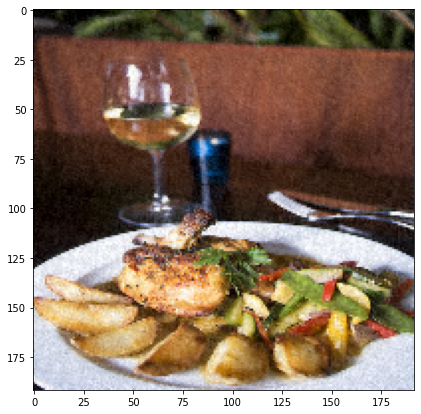

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 2, Loss: 0.01010472517227754


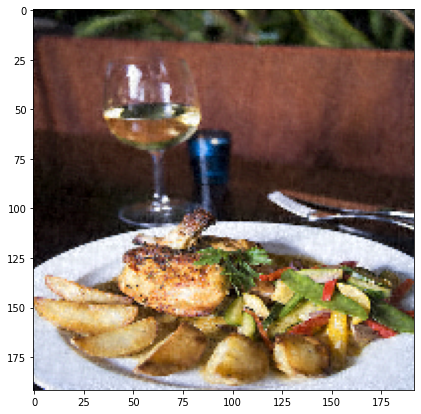

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 3, Loss: 0.008023190781629334


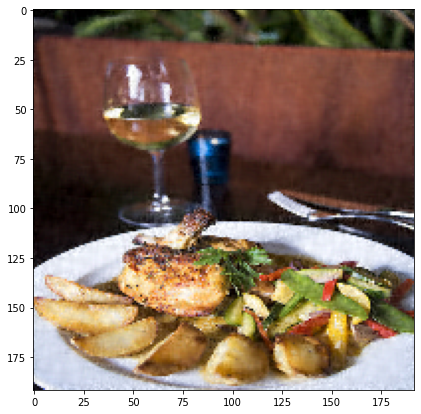

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 4, Loss: 0.0073225161875598134


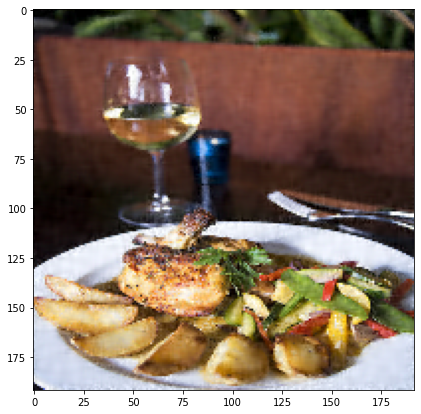

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 5, Loss: 0.007038113331266989


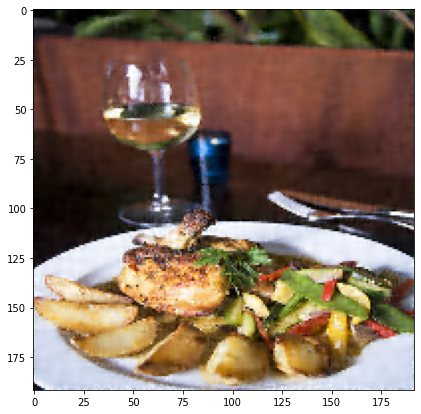

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 6, Loss: 0.006831749334620932


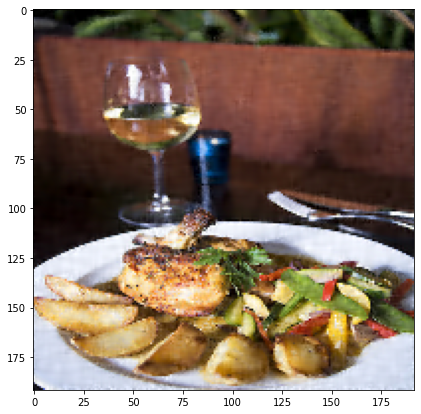

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 7, Loss: 0.006703009642660618


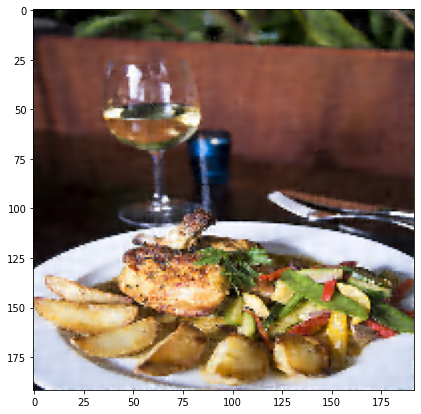

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 8, Loss: 0.006479749894545724


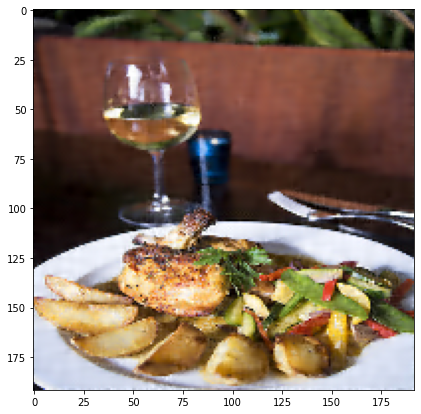

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 9, Loss: 0.006377713421049217


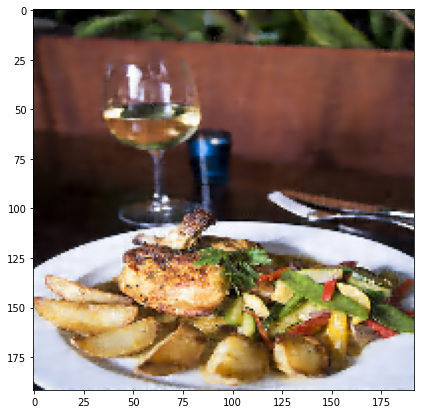

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 10, Loss: 0.0062616954479987426


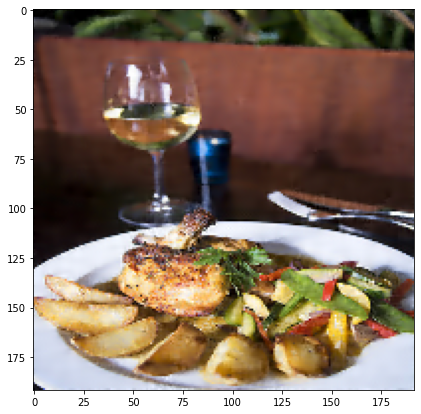

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 11, Loss: 0.00617752115164573


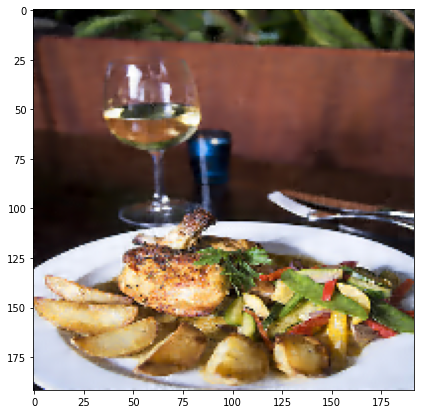

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 12, Loss: 0.006108655819358925


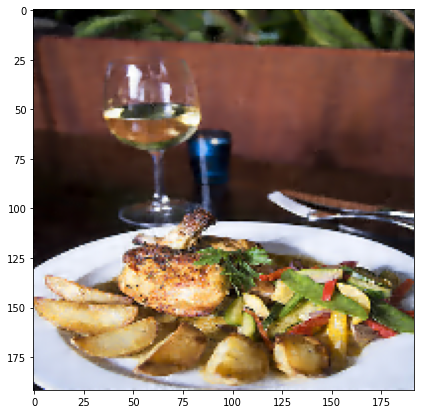

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 13, Loss: 0.006050080072600395


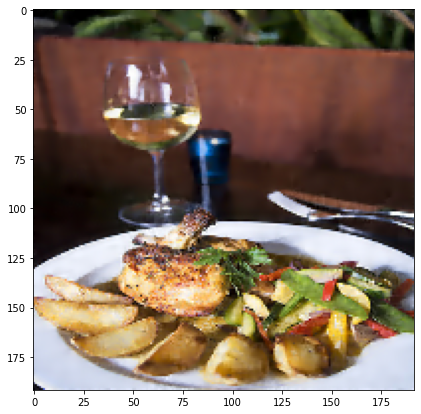

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 14, Loss: 0.005987833593583976


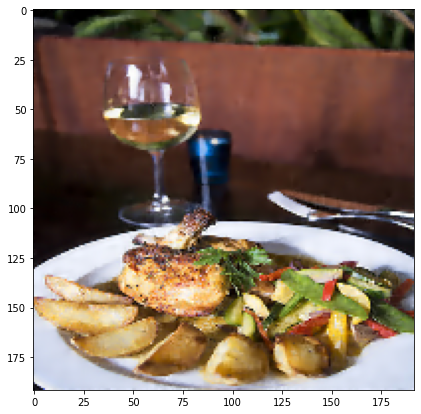

Iteration: 0.0
Iteration: 0.20100502512562815
Iteration: 0.4020100502512563
Iteration: 0.6030150753768844
Iteration: 0.8040201005025126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iter: 15, Loss: 0.0059180157588950046


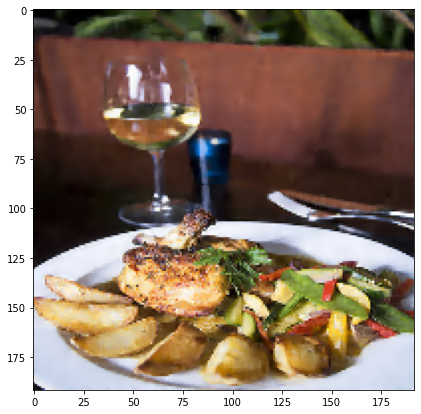

In [ ]:
A = torch.eye(size).to(device)
S = 6
train(training_steps,train_loader,S,A)

In [ ]:
torch.save(model.state_dict(), '/content/gdrive/MyDrive/ColabNotebooks/TDV_Model/TDV_2.pth')

### **Testing the Model**

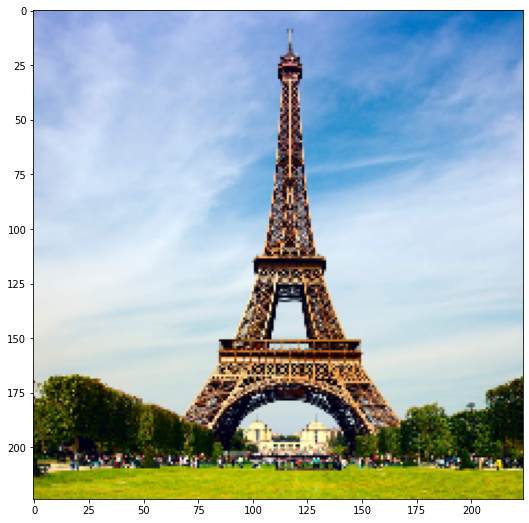

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


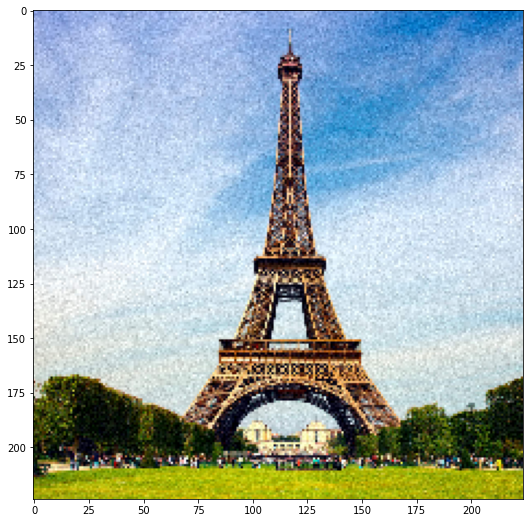

In [ ]:
filename = '/content/gdrive/MyDrive/ColabNotebooks/TDV_Model/eifeltower.jpeg'
size = 224
Resize = torchvision.transforms.Resize((size,size))

test_img =  torchvision.io.read_image(filename)
max = (torch.max(test_img))
min = (torch.min(test_img))
test_img = (test_img-min)/(max-min)
test_img = Resize(test_img)

disp_img(test_img)

sigma = 0.05
noise = np.random.normal(0, sigma, (test_img.shape[1],test_img.shape[2]))
test_noisy = test_img + noise
disp_img(test_noisy)

**Model Base Result:**

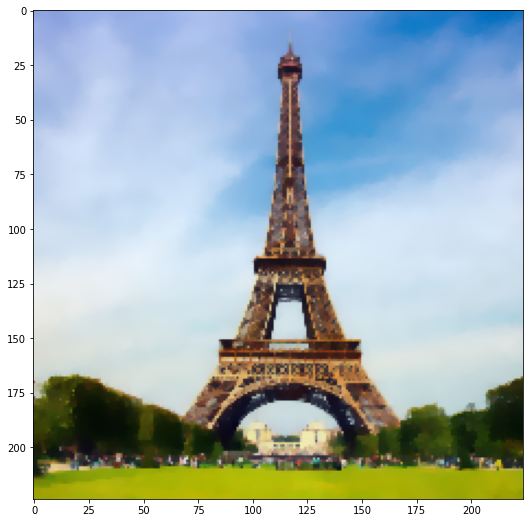

In [ ]:
test_noisy_tv = np.array(torch.permute(test_noisy[0],(1,2,0)).detach())
test_tv = denoise_tv_chambolle(test_noisy_tv, weight=0.09, eps=0.000001, n_iter_max=30, multichannel=True)

plt.figure()
plt.imshow(test_tv)
plt.show()

**Model Base Deep Learning Result:**

In [ ]:
state_dict = torch.load('/content/gdrive/MyDrive/ColabNotebooks/TDV_Model/TDV_2.pth')
model.load_state_dict(state_dict);
model.eval().cpu();

def val_step(image,z,S,A,T=0.0029):
    for s in range(S):
        term1 = torch.matmul(A.T,torch.matmul(A,image)-z)
        reg = model(image)
        Reg = torch.sum(reg)      
        term2 = torch.autograd.grad(Reg, image, retain_graph=True,create_graph=True)[0]
        term1 = torch.matmul(A.T,torch.matmul(A,image)-z)
        image = image - (T/S)*(term1+term2) 
    return image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


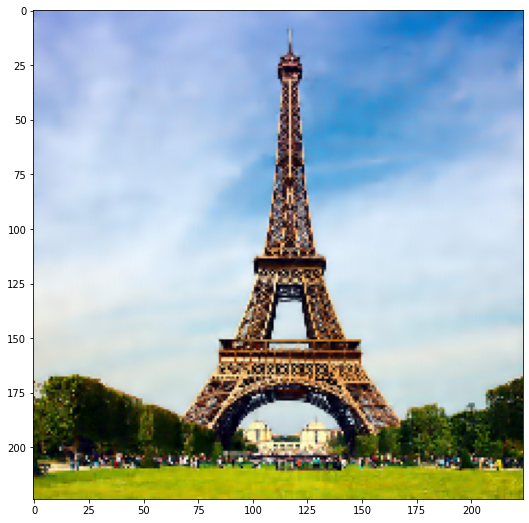

In [ ]:
T = 0.0029    #0.0029
S=6
A = torch.eye(size).float()
z = torch.empty_like(test_noisy).copy_(test_noisy).float() 
test_noisy = test_noisy.cpu().float().reshape(1,3,size,size).requires_grad_()


test_tdv = val_step(test_noisy,z,S,A,T)
test_tdv = test_tdv.reshape(3,size,size).detach()
disp_img(test_tdv)


### **Beyond Stopping Time**

In the article, the optimal stopping time is $T = 0.0029$ for image denoising. What happend if we going beyond the optimal stopping time? The images will get over-smooth and important details will get lost. Let see an example:

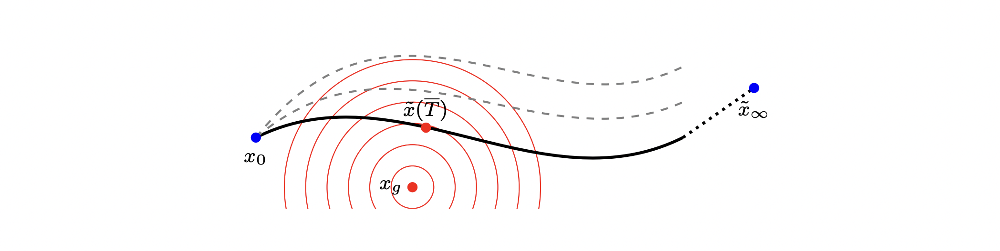

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


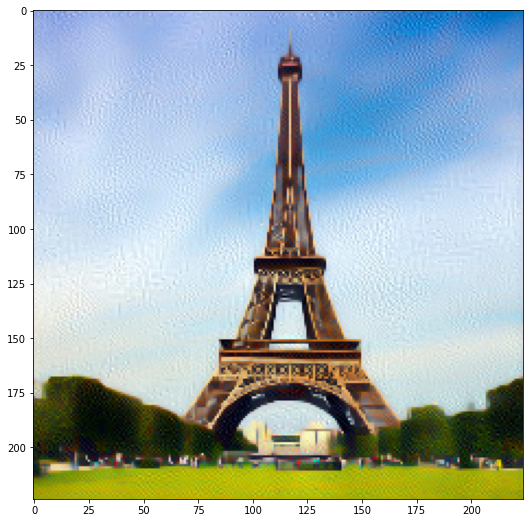

In [ ]:
T = 0.024
S=11

test_tdv = val_step(test_noisy,z,S,A,T)
test_tdv = test_tdv.reshape(3,size,size).detach()
disp_img(test_tdv)

### **Additions:**

In the original paper, it is shown that for too large values of $S$, the image become cartoon-like. Total Variation removes unwanted details whilst preserving important details as edges, but when $S$ is too large, important details get lost, while the edges remain still, results in the following figures:

(We did not manage to implement it due to RAM limitation on Colab when trying to backpropagating 20 iterative steps)

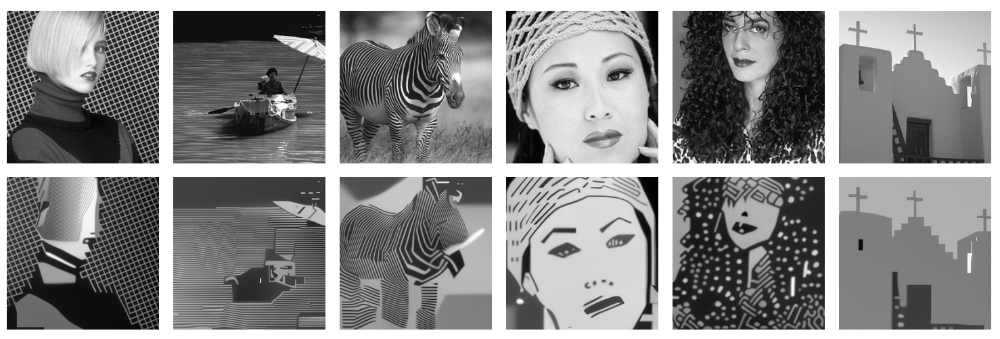

# **References:**

***Kobler, Erich, et al. "Total deep variation for linear inverse problems." Proceedings of the IEEE/CVF Conference on Computer Vision and Pattern Recognition. 2020.***

***Chambolle, Antonin. "An algorithm for total variation minimization and applications." Journal of Mathematical imaging and vision 20.1 (2004): 89-97.***

***DNN-Aided Priors - Model Base Deep Learning course, Lec.8 , Nir Shlezinger 2022, Ben Gurion University***

***Microsoft COCO Dataset***

***https://www.history.com/news/10-things-you-may-not-know-about-the-eiffel-tower***